In [1]:
import numpy as np
d = np.load('data/color_dataset.npz')
X, y = d['X'], d['y']

# X is 4-D -> (IR, L, a, b)
X

array([[ 54.94276822,  70.84520228,  -3.11104078,   3.88723023],
       [ 50.64530287,  71.31455623,   1.64365803,   1.0295951 ],
       [ 60.31557099,  65.8666481 ,  -0.49314621,   3.24299082],
       ...,
       [ 60.        ,  34.98880193,   3.79124773,  27.900538  ],
       [ 69.01960784,  29.94607024,  21.58353972,  22.18402194],
       [ 68.23529412,  49.91700031, -21.11996594,  42.01653423]])

In [2]:
from sklearn.linear_model import LogisticRegressionCV
clf = LogisticRegressionCV().fit(X, y)
clf.score(X, y)

0.9143532191376255

In [3]:

from skl2onnx import convert_sklearn
from skl2onnx.common.data_types import FloatTensorType
onx = convert_sklearn(clf, initial_types=[
    ('input_color', FloatTensorType((None, 4)))
])
with open("color_model.onnx", "wb") as f:
    f.write(onx.SerializeToString())  # type: ignore

In [4]:
import onnxruntime as rt
sess = rt.InferenceSession("color_model.onnx")
input_name = sess.get_inputs()[0].name
label_name = sess.get_outputs()[0].name

pred_onx = sess.run(['output_probability'], {input_name: X.astype(np.float32)})[0]
pred_onx

[{0: 0.9113831520080566, 1: 0.08861684799194336},
 {0: 0.9650920629501343, 1: 0.034907907247543335},
 {0: 0.8892631530761719, 1: 0.11073681712150574},
 {0: 0.786540150642395, 1: 0.21345984935760498},
 {0: 0.8774455785751343, 1: 0.12255442142486572},
 {0: 0.9829871654510498, 1: 0.017012834548950195},
 {0: 0.9351435899734497, 1: 0.06485641002655029},
 {0: 0.9378917813301086, 1: 0.06210821866989136},
 {0: 0.9205375909805298, 1: 0.07946240901947021},
 {0: 0.8234332203865051, 1: 0.17656677961349487},
 {0: 0.8425304889678955, 1: 0.1574695110321045},
 {0: 0.9259973764419556, 1: 0.07400259375572205},
 {0: 0.8930202722549438, 1: 0.10697975754737854},
 {0: 0.9917159080505371, 1: 0.008284062147140503},
 {0: 0.9542256593704224, 1: 0.04577434062957764},
 {0: 0.7838622331619263, 1: 0.21613779664039612},
 {0: 0.8907267451286316, 1: 0.10927325487136841},
 {0: 0.9011112451553345, 1: 0.09888872504234314},
 {0: 0.9574524164199829, 1: 0.0425475537776947},
 {0: 0.3624810576438904, 1: 0.6375189423561096},
 

In [5]:
[e.name for e in sess.get_outputs()]

['output_label', 'output_probability']

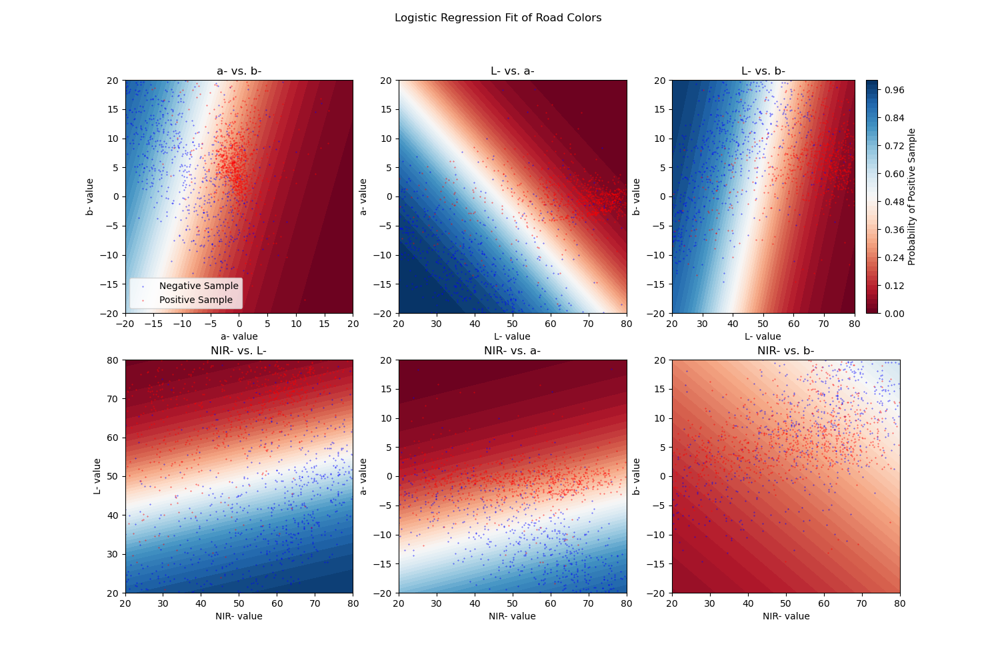

In [6]:
%matplotlib widget

import matplotlib.pyplot as plt
fig, ax = plt.subplots(2, 3, figsize=(15,10))
ax = ax.flatten()
fig.suptitle('Logistic Regression Fit of Road Colors ')
v = (y == 0)
pos, neg = X[v, ...], X[~v, ...]
sz = 0.1  # point size

# Median repeat helper
def med_r(X, idx, xx):
    return np.median(X[:, idx]).repeat(len(xx.ravel()))

# Grid 1: a vs b (both median IR and L)
# Grids 2-3 Median IR
# Grids 4-5 Median L

# Grid 1 -> Median L-, a- vs. b-
xx, yy = np.mgrid[-30:30:0.5, -30:30:0.5]
grid = np.c_[med_r(X, 0, xx), med_r(X, 1, xx), xx.ravel(), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[0].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[0].scatter(neg[:, 2], neg[:, 3], sz, 'b', label='Negative Sample')
ax[0].scatter(pos[:, 2], pos[:, 3], sz, 'r', label='Positive Sample')
ax[0].set_xlim(-20, 20)
ax[0].set_ylim(-20, 20)
ax[0].set_title('a- vs. b-')
ax[0].set_xlabel('a- value')
ax[0].set_ylabel('b- value')
ax[0].legend()

# Grid 2 -> L- vs. a-, median b-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[med_r(X, 0, xx), xx.ravel(), yy.ravel(), med_r(X, 3, xx)]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[1].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[1].scatter(neg[:, 1], neg[:, 2], sz, 'b')
ax[1].scatter(pos[:, 1], pos[:, 2], sz, 'r')
ax[1].set_xlim(20, 80)
ax[1].set_ylim(-20, 20)
ax[1].set_title('L- vs. a-')
ax[1].set_xlabel('L- value')
ax[1].set_ylabel('a- value')

# Grid 3 -> L- vs b-, median a-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[med_r(X, 0, xx), xx.ravel(), med_r(X, 2, xx), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
c = ax[2].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0., vmax=1.)
ax[2].scatter(neg[:, 1], neg[:, 3], sz, 'b')
ax[2].scatter(pos[:, 1], pos[:, 3], sz, 'r')
ax[2].set_xlim(20, 80)
ax[2].set_ylim(-20, 20)
ax[2].set_title('L- vs. b-')
ax[2].set_xlabel('L- value')
ax[2].set_ylabel('b- value')

# Grid 4 -> IR- vs. L-, median a-, median b-
xx, yy = np.mgrid[0:100:0.5, 0:100:0.5]
grid = np.c_[xx.ravel(), yy.ravel(), med_r(X, 2, xx), med_r(X, 3, xx)]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[3].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[3].scatter(neg[:, 0], neg[:, 1], sz, 'b')
ax[3].scatter(pos[:, 0], pos[:, 1], sz, 'r')
ax[3].set_xlim(20, 80)
ax[3].set_ylim(20, 80)
ax[3].set_title('NIR- vs. L-')
ax[3].set_xlabel('NIR- value')
ax[3].set_ylabel('L- value')

# Grid 5 -> IR- vs. a-, median b-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[xx.ravel(), med_r(X, 1, xx), yy.ravel(), med_r(X, 3, xx)]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[4].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0, vmax=1)
ax[4].scatter(neg[:, 0], neg[:, 2], sz, 'b')
ax[4].scatter(pos[:, 0], pos[:, 2], sz, 'r')
ax[4].set_xlim(20, 80)
ax[4].set_ylim(-20, 20)
ax[4].set_title('NIR- vs. a-')
ax[4].set_xlabel('NIR- value')
ax[4].set_ylabel('a- value')

# Grid 6 -> IR- vs b-, median a-
xx, yy = np.mgrid[0:100:0.5, -30:30:0.5]
grid = np.c_[xx.ravel(), med_r(X, 1, xx), med_r(X, 2, xx), yy.ravel()]
probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)
ax[5].contourf(xx, yy, probs, 50, cmap="RdBu", vmin=0., vmax=1.)
ax[5].scatter(neg[:, 0], neg[:, 3], sz, 'b')
ax[5].scatter(pos[:, 0], pos[:, 3], sz, 'r')
ax[5].set_xlim(20, 80)
ax[5].set_ylim(-20, 20)
ax[5].set_title('NIR- vs. b-')
ax[5].set_xlabel('NIR- value')
ax[5].set_ylabel('b- value')

fig.colorbar(c, ax=ax[2], label='Probability of Positive Sample')

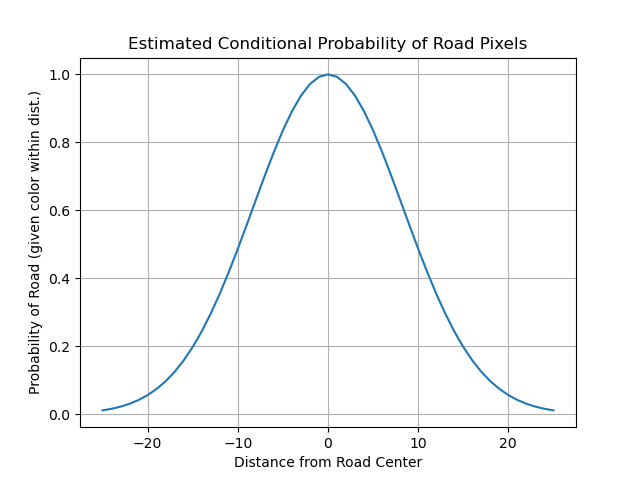

In [7]:
%matplotlib widget

from scipy.stats import norm

xlim = 25
sigma = xlim / 3
pdf_y = lambda x: norm.pdf(x, scale=sigma) * np.sqrt(2 * np.pi * sigma ** 2)

pdf_x = np.arange(-xlim, xlim + 1)
fig, ax = plt.subplots()
ax.plot(pdf_x, pdf_y(pdf_x))
ax.set_xlabel('Distance from Road Center')
ax.set_ylabel('Probability of Road (given color within dist.)')
ax.set_title('Estimated Conditional Probability of Road Pixels')
ax.grid()

In [8]:
import sqlite3
import pandas as pd
from IPython.display import display

# Connect to sqlite database and get all truthed roadways with no obscuration that are valid
with sqlite3.connect('file:/data/road_surface_classifier/features.sqlite3?mode=ro', uri=True) as con:
    cursor = con.cursor()
    cursor.execute("""
        SELECT osm_id, chip_path from features
        WHERE obscuration = -1 AND no_data = 0 and bad_detect = 0;
    """)
    rows = cursor.fetchall()

# Put this all in a dataframe
df = pd.DataFrame(rows, columns=['osm_id', 'chip_path']).set_index('osm_id')

# Load OSM features and extract WKT values for the OSM IDs from above
osm_df = pd.read_csv('/data/road_surface_classifier/features.csv')
osm_df = osm_df.set_index('osm_id').loc[df.index][['wkt', 'x', 'y']]

# Combine this with our original DataFrame to get a "super-duper" DataFrame with wkt values
df = pd.concat([df, osm_df], axis=1)
display(df)

No such comm: b27ede957d944529acb27a24ad5935f8


,chip_path,wkt,x,y
osm_id,,,,
18250855,/data/road_surface_classifier/imagery/18250855...,"LINESTRING (-92.1110707 46.8673405,-92.1325183...",31987.980469,46171.644531
557603585,/data/road_surface_classifier/imagery/55760358...,"LINESTRING (-95.3910744 29.7243077,-95.3910989...",30804.613281,54192.378906
985683353,/data/road_surface_classifier/imagery/98568335...,"LINESTRING (-95.5234816 29.7505134,-95.5233766...",30756.496094,54181.253906
979952292,/data/road_surface_classifier/imagery/97995229...,"LINESTRING (-80.4055351 33.7118104,-80.4055288...",36260.238281,52486.886719
11180746,/data/road_surface_classifier/imagery/11180746...,"LINESTRING (-81.3570189 28.6101698,-81.3570119...",35914.312500,54656.812500
...,...,...,...,...
12550668,/data/road_surface_classifier/imagery/12550668...,"LINESTRING (-79.4810526 33.7405357,-79.4810279...",36597.484375,52473.953125
10160184,/data/road_surface_classifier/imagery/10160184...,"LINESTRING (-111.635913 38.992937,-111.6359837...",24887.011719,50121.093750
450305723,/data/road_surface_classifier/imagery/45030572...,"LINESTRING (-71.4058998 42.152198,-71.405813 4...",39537.695312,48580.906250


In [9]:
import sys; sys.path.append('..')
from osgeo import ogr, osr
ogr.UseExceptions()

import PIL.Image
import PIL.ImageDraw

import skimage.draw

from rsc.common.utils import imread, imread_geotransform, imread_srs, map_to_pix

# Standard WGS-84 spatial reference
srs_ref = osr.SpatialReference()
srs_ref.ImportFromEPSG(4326)
srs_ref.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)

def to_image_space(row):
    # Get list of points from WKT
    geom = ogr.CreateGeometryFromWkt(row['wkt'])
    pts = np.array(
        [geom.GetPoint_2D(idx) for idx in range(geom.GetPointCount())])
    lon_ar, lat_ar = pts[:, 0], pts[:, 1]

    # Get the image's geotransform
    xform = imread_geotransform(row['chip_path'])

    # Get the spatial reference (they change across the tiles)
    srs = osr.SpatialReference()
    srs.ImportFromProj4(imread_srs(row['chip_path']))
    srs.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)
    im_trans = osr.CoordinateTransformation(srs_ref, srs)

    # Get list of points from WKT
    geom: ogr.Geometry = ogr.CreateGeometryFromWkt(row['wkt'])
    geom.Transform(im_trans)
    pts = np.array(
        [geom.GetPoint_2D(idx) for idx in range(geom.GetPointCount())])

    # Convert to image-space x, y
    ix, iy = map_to_pix(xform, pts[:, 0], pts[:, 1])

    # Load image
    im = imread(row['chip_path'])

    return im, ix, iy

def create_mask_from_image_space(im, ix, iy, width=2, scale=4):
    # Create a new image of the same shape, and draw a line
    # to create a mask
    mask = np.zeros((im.shape[0], im.shape[1]), dtype=np.uint8)
    mask_pil = PIL.Image.new('L', ((im.shape[1] * scale, im.shape[0] * scale)), color=0)
    d = PIL.ImageDraw.Draw(mask_pil)
    d.line(
        [(x * scale, y * scale) for x, y in zip(ix, iy)],     # type: ignore
        fill=255,
        width=width * scale,
        joint="curve")
    mask_pil = mask_pil.resize((im.shape[0], im.shape[1]), PIL.Image.Resampling.LANCZOS)
    mask = np.array(mask_pil)
    return mask

def create_mask(row, width=2):    
    im, ix, iy = to_image_space(row)
    mask = create_mask_from_image_space(im, ix, iy, width)
    return im, mask

100%|██████████| 10/10 [00:05<00:00,  1.75it/s]


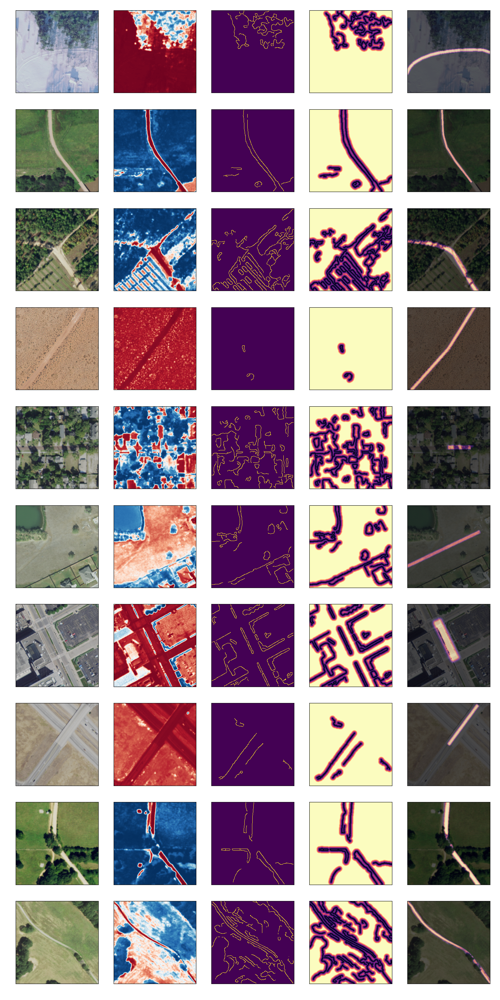

In [86]:
%matplotlib widget

from tqdm import tqdm
import scipy.ndimage
from scipy.special import erf
import skimage.color
import skimage.feature
import skimage.morphology

rows, cols = 10, 5
fig, ax = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows), sharex=True, sharey=True)
fig.tight_layout()
for ax_ in ax.flatten():  # type: ignore
    ax_.get_xaxis().set_visible(False)
    ax_.get_yaxis().set_visible(False)

cmap = 'RdBu_r'

pdf_y = lambda x, sigma: norm.pdf(x, scale=sigma) * np.sqrt(2 * np.pi * sigma ** 2)

s = df.sample(frac=1, random_state=44).reset_index(drop=True) # random_state=43
s = s.iloc[:rows]
for idx in tqdm(range(len(s))):
    row = s.iloc[idx]

    # Load the image and create a mask around the middle of the road
    im, mask = create_mask(row, width=2)

    # Convert to LAB + NIR and predict using the model
    im_irlab = np.dstack((
        im[..., (3,)] * (100.0 / 255),
        skimage.color.rgb2lab(im[..., (0, 1, 2)])))
    pred = clf.predict_proba(im_irlab.reshape(-1, 4))[:, 0]
    pred = pred.reshape((im.shape[0], im.shape[1]))

    # Blur it a little bit
    pred_clf = scipy.ndimage.gaussian_filter(pred, sigma=1)

    # Use canny edges + distance transform to estimate road width
    edges = skimage.feature.canny(pred_clf, sigma=2)
    edges = ~skimage.morphology.area_closing(~edges, 50, connectivity=2)
    dist: np.ndarray = scipy.ndimage.distance_transform_edt(~edges)  # type: ignore

    # Test for physcially-realistic answer
    # < 2 lanes or > 6 lanes, assuming 10ft wide lanes on average
    w = 2 * np.median(dist[np.where(mask)]).astype(int)
    if (w < 3 or w > 23):
        w = 6 # assume two lane road

    # Update the mask with our new width
    _, mask = create_mask(row, width=w)

    # Fit a probability assuming a normal distribution and our width is 3-sigma from the mean
    dist_m: np.ndarray = scipy.ndimage.distance_transform_edt(~mask)  # type: ignore
    dist_pdf = pdf_y(dist_m.reshape((-1,)), w / 3.0).reshape(dist_m.shape)

    # Update prediction. This is our final probability mask
    pred = pred_clf * dist_pdf

    # Plot
    ax[idx][0].imshow(im[..., :3])
    ax[idx][1].imshow(pred_clf, cmap=cmap, vmin=0, vmax=1)
    ax[idx][2].imshow(edges, vmin=0, vmax=1, interpolation='none')
    ax[idx][3].imshow(dist, vmin=0, vmax=10, cmap='magma')
    ax[idx][4].imshow(im[:, :, (0, 1, 2)])
    ax[idx][4].imshow(pred, cmap='magma', vmin=0, vmax=1, alpha=0.6)



In [88]:
import pathlib
from rsc.common.utils import wgs84_to_im
from rsc.common.utils import map_to_pix, imread, imread_geotransform, imread_srs, imwrite

# Load features dataframe
df = pd.read_csv(str('/data/road_surface_classifier/features.csv'))

# Chip path
def get_chip_path(row):
    chip_path = pathlib.Path('/data/road_surface_classifier/imagery/') / f'{row["osm_id"]}.tif'
    assert chip_path.exists()
    return chip_path    
df['chip_path'] = df.apply(get_chip_path, axis=1)

# Standard WGS-84 spatial reference
srs_ref = osr.SpatialReference()
srs_ref.ImportFromEPSG(4326)
srs_ref.SetAxisMappingStrategy(osr.OAMS_TRADITIONAL_GIS_ORDER)

# Mask creation loop
print('Creating masks from OSM data...')
for idx in tqdm(range(len(df))):

    # Load in row
    row = df.iloc[idx]

    # Load the image and create a mask around the middle of the road
    im, mask = create_mask(row, width=2)

    # Convert to LAB + NIR and predict using the model
    im_irlab = np.dstack((
        im[..., (3,)] * (100.0 / 255),
        skimage.color.rgb2lab(im[..., (0, 1, 2)])))
    pred = clf.predict_proba(im_irlab.reshape(-1, 4))[:, 0]
    pred = pred.reshape((im.shape[0], im.shape[1]))

    # Blur it a little bit
    pred_clf = scipy.ndimage.gaussian_filter(pred, sigma=1)

    # Use canny edges + distance transform to estimate road width
    edges = skimage.feature.canny(pred_clf, sigma=2)
    edges = ~skimage.morphology.area_closing(~edges, 50, connectivity=2)
    dist: np.ndarray = scipy.ndimage.distance_transform_edt(~edges)  # type: ignore

    # Test for physcially-realistic answer
    # < 2 lanes or > 6 lanes, assuming 10ft wide lanes on average
    w = 2 * np.median(dist[np.where(mask)]).astype(int)
    if (w < 3 or w > 23):
        w = 6 # assume two lane road

    # Update the mask with our new width
    _, mask = create_mask(row, width=w)

    # Fit a probability assuming a normal distribution and our width is 3-sigma from the mean
    dist_m: np.ndarray = scipy.ndimage.distance_transform_edt(~mask)  # type: ignore
    dist_pdf = pdf_y(dist_m.reshape((-1,)), w / 3.0).reshape(dist_m.shape)

    # Update prediction. This is our final probability mask
    pred = ((pred_clf * dist_pdf) * 255.0).astype(np.uint8)

    # Save the mask
    out_file = ('/data/road_surface_classifier/probmasks/%d.png' % row['osm_id'])
    imwrite(pred, out_file)

Creating masks from OSM data...


100%|██████████| 46491/46491 [2:03:48<00:00,  6.26it/s]  
